<div class="alert alert-block alert-info">
<center> <h1> Business Cases with Data Science MDSAA-BA </h1> </center> <br>
<center> Business Case 2 - 2020/2021 </center>

**GROUP Z:** <br>
- Ana Paulino (20170743) <br>
- Carolina Pina (20170790) <br>
- Soraia Cunha (20170806)

## Data Understanding

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from datetime import datetime
from sklearn.impute import KNNImputer
from math import ceil
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import RFE
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import mutual_info_classif
from imblearn.over_sampling import ADASYN
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.metrics import classification_report, confusion_matrix, precision_score
from scikitplot.metrics import plot_cumulative_gain, plot_lift_curve
import graphviz
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score

In [2]:
data=pd.read_csv("H2.csv")

In [3]:
data.head()

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
0,0,6,2015,July,27,1,0,2,1,0.0,...,No Deposit,6,NULL,0,Transient,0.0,0,0,Check-Out,2015-07-03
1,1,88,2015,July,27,1,0,4,2,0.0,...,No Deposit,9,NULL,0,Transient,76.5,0,1,Canceled,2015-07-01
2,1,65,2015,July,27,1,0,4,1,0.0,...,No Deposit,9,NULL,0,Transient,68.0,0,1,Canceled,2015-04-30
3,1,92,2015,July,27,1,2,4,2,0.0,...,No Deposit,9,NULL,0,Transient,76.5,0,2,Canceled,2015-06-23
4,1,100,2015,July,27,2,0,2,2,0.0,...,No Deposit,9,NULL,0,Transient,76.5,0,1,Canceled,2015-04-02


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79330 entries, 0 to 79329
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   IsCanceled                   79330 non-null  int64  
 1   LeadTime                     79330 non-null  int64  
 2   ArrivalDateYear              79330 non-null  int64  
 3   ArrivalDateMonth             79330 non-null  object 
 4   ArrivalDateWeekNumber        79330 non-null  int64  
 5   ArrivalDateDayOfMonth        79330 non-null  int64  
 6   StaysInWeekendNights         79330 non-null  int64  
 7   StaysInWeekNights            79330 non-null  int64  
 8   Adults                       79330 non-null  int64  
 9   Children                     79326 non-null  float64
 10  Babies                       79330 non-null  int64  
 11  Meal                         79330 non-null  object 
 12  Country                      79306 non-null  object 
 13  MarketSegment   

In [5]:
data.shape

(79330, 31)

In [6]:
profile = ProfileReport(data, title="Pandas Profiling Report")
profile

In [7]:
data.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
IsCanceled,79330,NaN,NaN,NaN,0.41727,0.493111,0,0,0,1,1
LeadTime,79330,NaN,NaN,NaN,109.736,110.949,0,23,74,163,629
ArrivalDateYear,79330,NaN,NaN,NaN,2016.17,0.699181,2015,2016,2016,2017,2017
ArrivalDateMonth,79330,12,August,8983,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ArrivalDateWeekNumber,79330,NaN,NaN,NaN,27.1774,13.3985,1,17,27,38,53
ArrivalDateDayOfMonth,79330,NaN,NaN,NaN,15.7866,8.72845,1,8,16,23,31
StaysInWeekendNights,79330,NaN,NaN,NaN,0.795185,0.885026,0,0,1,2,16
StaysInWeekNights,79330,NaN,NaN,NaN,2.18296,1.45642,0,1,2,3,41
Adults,79330,NaN,NaN,NaN,1.85098,0.509292,0,2,2,2,4
Children,79326,NaN,NaN,NaN,0.0913698,0.372177,0,0,0,0,3


In [8]:
# Check missing values
data.isnull().sum()

IsCanceled                      0
LeadTime                        0
ArrivalDateYear                 0
ArrivalDateMonth                0
ArrivalDateWeekNumber           0
ArrivalDateDayOfMonth           0
StaysInWeekendNights            0
StaysInWeekNights               0
Adults                          0
Children                        4
Babies                          0
Meal                            0
Country                        24
MarketSegment                   0
DistributionChannel             0
IsRepeatedGuest                 0
PreviousCancellations           0
PreviousBookingsNotCanceled     0
ReservedRoomType                0
AssignedRoomType                0
BookingChanges                  0
DepositType                     0
Agent                           0
Company                         0
DaysInWaitingList               0
CustomerType                    0
ADR                             0
RequiredCarParkingSpaces        0
TotalOfSpecialRequests          0
ReservationSta

In [9]:
data.dtypes

IsCanceled                       int64
LeadTime                         int64
ArrivalDateYear                  int64
ArrivalDateMonth                object
ArrivalDateWeekNumber            int64
ArrivalDateDayOfMonth            int64
StaysInWeekendNights             int64
StaysInWeekNights                int64
Adults                           int64
Children                       float64
Babies                           int64
Meal                            object
Country                         object
MarketSegment                   object
DistributionChannel             object
IsRepeatedGuest                  int64
PreviousCancellations            int64
PreviousBookingsNotCanceled      int64
ReservedRoomType                object
AssignedRoomType                object
BookingChanges                   int64
DepositType                     object
Agent                           object
Company                         object
DaysInWaitingList                int64
CustomerType             

In [10]:
#Checking duplicated values
data.loc[data.duplicated(keep="first"), :]

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
9,1,62,2015,July,27,2,2,3,2,0.0,...,No Deposit,8,NULL,0,Transient,76.50,0,1,No-Show,2015-07-02
12,0,43,2015,July,27,3,0,2,2,0.0,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
17,0,43,2015,July,27,3,0,2,2,0.0,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
18,0,43,2015,July,27,3,0,2,2,0.0,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
22,0,43,2015,July,27,3,0,2,2,0.0,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79289,0,186,2017,August,35,31,0,3,2,0.0,...,No Deposit,9,NULL,0,Transient,126.00,0,2,Check-Out,2017-09-03
79292,0,63,2017,August,35,31,0,3,3,0.0,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79293,0,63,2017,August,35,31,0,3,3,0.0,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79294,0,63,2017,August,35,31,0,3,3,0.0,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03


In [11]:
data.loc[data['ReservationStatus'] == 'No-Show'].groupby('IsCanceled').count()

,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
IsCanceled,,,,,,,,,,,,,,,,,,,,,
1,916,916,916,916,916,916,916,916,916,916,...,916,916,916,916,916,916,916,916,916,916


In [12]:
data.loc[(data['Babies']>3) | (data["Children"]>2)]

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
867,0,0,2015,August,33,9,2,0,2,3.0,...,No Deposit,9,NULL,0,Contract,153.00,0,0,Check-Out,2015-08-11
924,0,1,2015,August,33,10,1,1,0,3.0,...,No Deposit,NULL,NULL,0,Transient-Party,9.00,0,0,Check-Out,2015-08-12
6072,1,6,2015,December,51,13,1,0,0,3.0,...,No Deposit,8,NULL,0,Transient-Party,104.25,0,1,Canceled,2015-12-10
6559,0,37,2016,January,3,12,0,2,2,0.0,...,No Deposit,9,NULL,0,Transient,84.45,0,1,Check-Out,2016-01-14
11135,1,66,2016,May,21,15,2,3,1,3.0,...,No Deposit,14,NULL,0,Transient,193.50,0,0,Canceled,2016-03-28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78315,0,139,2017,August,33,15,0,4,2,3.0,...,No Deposit,NULL,14,0,Transient,300.00,0,1,Check-Out,2017-08-19
78497,0,6,2017,August,34,21,1,0,2,3.0,...,No Deposit,7,NULL,0,Transient,264.44,0,2,Check-Out,2017-08-22
78792,0,215,2017,August,34,25,0,1,2,3.0,...,No Deposit,14,NULL,0,Transient,245.00,0,1,Check-Out,2017-08-26
78994,0,8,2017,August,34,26,2,1,2,3.0,...,No Deposit,7,NULL,0,Transient,253.51,0,2,Check-Out,2017-08-29


In [13]:
data.loc[data["CustomerType"]=="Group"]

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
586,1,1,2015,August,32,4,0,2,1,0.0,...,No Deposit,NULL,40,0,Group,65.0,0,0,Canceled,2015-08-03
759,0,0,2015,August,32,8,0,1,2,0.0,...,No Deposit,14,NULL,0,Group,75.0,0,0,Check-Out,2015-08-09
1388,0,1,2015,August,34,16,2,1,2,0.0,...,No Deposit,14,NULL,0,Group,139.0,0,0,Check-Out,2015-08-19
1543,0,4,2015,August,34,19,1,4,2,0.0,...,No Deposit,14,NULL,0,Group,89.0,0,0,Check-Out,2015-08-24
2063,0,5,2015,August,36,31,1,3,2,0.0,...,No Deposit,14,NULL,0,Group,85.0,0,0,Check-Out,2015-09-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75988,0,468,2017,July,30,29,2,1,1,0.0,...,No Deposit,229,NULL,0,Group,0.0,0,0,Check-Out,2017-08-01
76749,0,76,2017,August,32,6,2,0,3,0.0,...,No Deposit,14,NULL,0,Group,179.5,0,1,Check-Out,2017-08-08
78105,0,3,2017,August,32,6,4,6,2,0.0,...,No Deposit,20,NULL,0,Group,89.0,0,0,Check-Out,2017-08-16
78521,0,11,2017,August,34,25,0,2,2,0.0,...,No Deposit,98,NULL,0,Group,125.0,0,0,Check-Out,2017-08-27


In [14]:
data.loc[data['ADR']==0].groupby('ReservationStatus').count()
# We believe that ADR =0 is connected to promotions,vouchers,among others...

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,BookingChanges,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatusDate
ReservationStatus,,,,,,,,,,,,,,,,,,,,,
Canceled,114,114,114,114,114,114,114,114,114,114,...,114,114,114,114,114,114,114,114,114,114
Check-Out,1079,1079,1079,1079,1079,1079,1079,1079,1079,1079,...,1079,1079,1079,1079,1079,1079,1079,1079,1079,1079
No-Show,15,15,15,15,15,15,15,15,15,15,...,15,15,15,15,15,15,15,15,15,15


In [15]:
data.groupby(['MarketSegment',"DistributionChannel"]).count()

IsCanceled  LeadTime  ArrivalDateYear  \
MarketSegment DistributionChannel                                          
Aviation      Corporate                   227       227              227   
              TA/TO                        10        10               10   
Complementary Corporate                    69        69               69   
              Direct                      437       437              437   
              TA/TO                        36        36               36   
Corporate     Corporate                  2636      2636             2636   
              Direct                       56        56               56   
              TA/TO                       294       294              294   
Direct        Corporate                     6         6                6   
              Direct                     6048      6048             6048   
              GDS                           1         1                1   
              TA/TO                        37        37               37   
              Undefined                     1         1                1   
Groups        Corporate                   240       240              240   
              Direct                      177       177              177   
              TA/TO                     13558     13558            13558   
Offline TA/TO Corporate                   198       198              198   
              Direct                        6         6                6   
              GDS                          45        45               45   
              TA/TO                     16498     16498            16498   
Online TA     Corporate                    32        32               32   
              Direct                       56        56               56   
              GDS                         147       147              147   
              TA/TO                     38512     38512            38512   
              Undefined                     1         1                1   
Undefined     Undefined                     2         2                2   

                                   ArrivalDateMonth  ArrivalDateWeekNumber  \
MarketSegment DistributionChannel                                            
Aviation      Corporate                         227                    227   
              TA/TO                              10                     10   
Complementary Corporate                          69                     69   
              Direct                            437                    437   
              TA/TO                              36                     36   
Corporate     Corporate                        2636                   2636   
              Direct                             56                     56   
              TA/TO                             294                    294   
Direct        Corporate                           6                      6   
              Direct                           6048                   6048   
              GDS                                 1                      1   
              TA/TO                              37                     37   
              Undefined                           1                      1   
Groups        Corporate                         240                    240   
              Direct                            177                    177   
              TA/TO                           13558                  13558   
Offline TA/TO Corporate                         198                    198   
              Direct                              6                      6   
              GDS                                45                     45   
              TA/TO                           16498                  16498   
Online TA     Corporate                          32                     32   
              Direct                             56                     56   
              GDS                 

In [16]:
data["ReservationStatusDate"] =pd.to_datetime(data["ReservationStatusDate"], format='%Y-%m-%d')

In [17]:
data.dtypes

IsCanceled                              int64
LeadTime                                int64
ArrivalDateYear                         int64
ArrivalDateMonth                       object
ArrivalDateWeekNumber                   int64
ArrivalDateDayOfMonth                   int64
StaysInWeekendNights                    int64
StaysInWeekNights                       int64
Adults                                  int64
Children                              float64
Babies                                  int64
Meal                                   object
Country                                object
MarketSegment                          object
DistributionChannel                    object
IsRepeatedGuest                         int64
PreviousCancellations                   int64
PreviousBookingsNotCanceled             int64
ReservedRoomType                       object
AssignedRoomType                       object
BookingChanges                          int64
DepositType                       

In [18]:
# As we do not want that duplicates have a negative impact on the predictive analysis we decide to remove them

In [19]:
#Drop duplicates
data.drop_duplicates(keep="first",inplace=True)

In [20]:
data=data.drop(columns={"Company","Country"})

In [21]:
non_metric_features=["ArrivalDateYear","ArrivalDateMonth","Meal","DistributionChannel",
                     "IsRepeatedGuest","ReservedRoomType","AssignedRoomType","DepositType","Agent","CustomerType",
                     "ReservationStatus"]
metric_features = data.columns.drop(non_metric_features).drop("IsCanceled").to_list()

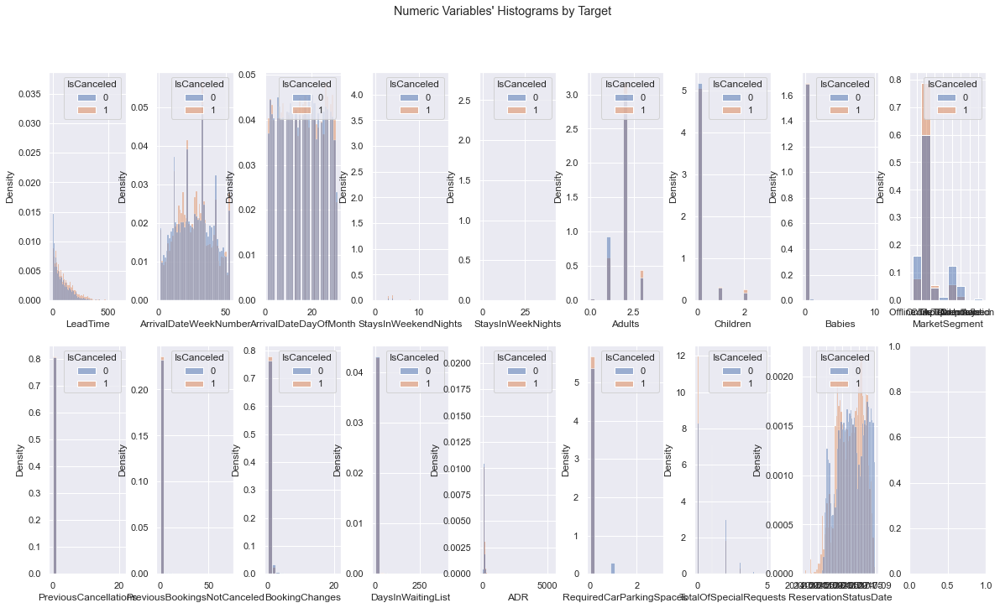

In [22]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot:
for ax, feat in zip(axes.flatten(), metric_features):
    sns.histplot(x=data[feat], hue=data['IsCanceled'], stat='density', common_norm=False, ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms by Target"
plt.suptitle(title)
plt.subplots_adjust(wspace=0.4)

plt.show()

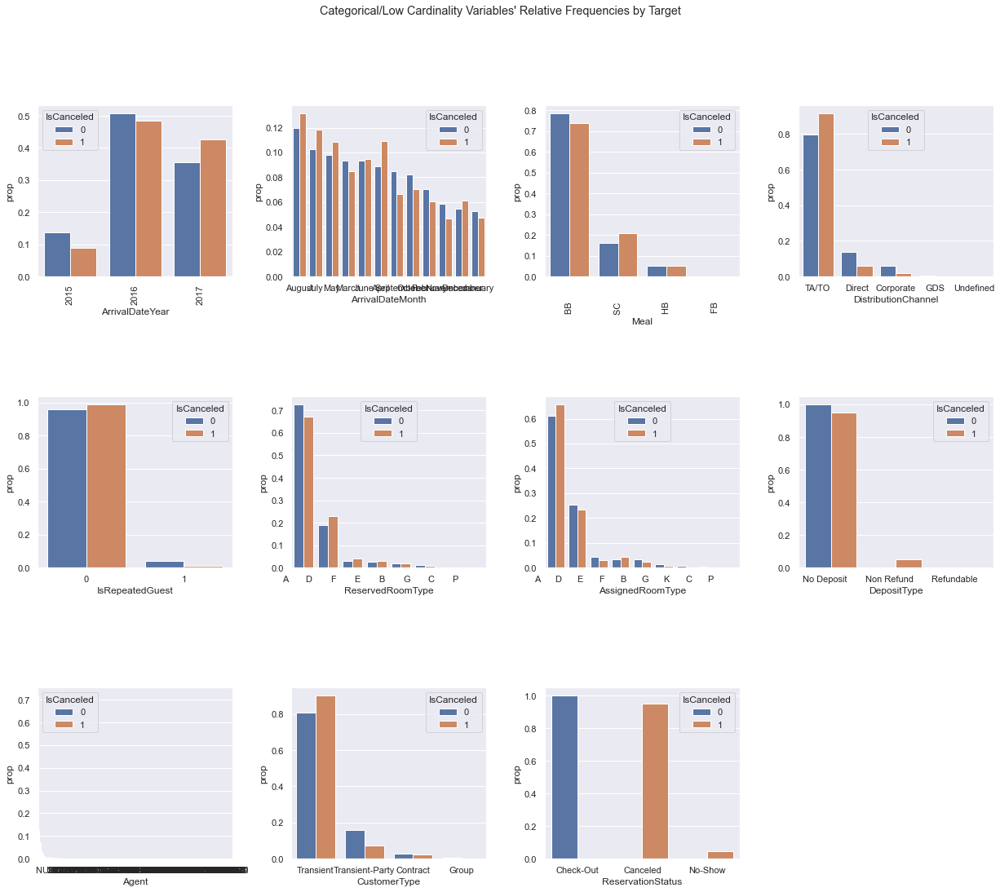

In [23]:
sns.set()

features = non_metric_features 

# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(3, ceil(len(features) / 3), figsize=(21, 17))

# Plot data
# Iterate across axes objects and associate each bar plot:
for ax, feat in zip(axes.flatten(), features):
    data_2 = data.groupby(['IsCanceled'])[feat].value_counts(normalize=True).rename('prop').reset_index()
    sns.barplot(data=data_2, x=feat, y='prop', hue='IsCanceled', ax=ax)

title = "Categorical/Low Cardinality Variables' Relative Frequencies by Target"
plt.suptitle(title)
# Rotating X-axis labels
axes.flatten()[0].tick_params(axis='x', labelrotation = 90)
axes.flatten()[2].tick_params(axis='x', labelrotation = 90)
axes.flatten()[-1].remove()
plt.subplots_adjust(wspace=0.3, hspace=0.7)

plt.show()

**Observation:**
- Missing values in the variables Country and children
- We drop company because more than 50% of the data was null
- Possible outliers in the following variables: LeadTime, Babies, IsRepeatedGuest, PreviousCancellations, PreviousBookingsNotCanceled, BookingChanges, DaysInWaitingList and ADR
- 41.7% of the customers canceled the reservation
- 2.6% of the customers are repeated guests
- 32.7% of the customers were duplicate rows

## Data Preparation

In [24]:
#Replace Null of variable Agent
data=data.replace(to_replace ='       NULL', value ="Independent") 

In [25]:
data=data.drop(columns={"MarketSegment","DepositType"})

In [26]:
data["IsCanceled"].value_counts(normalize=True)

0    0.699614
1    0.300386
Name: IsCanceled, dtype: float64

### Coherence Checking

#### check if room booked is equal to the given room 

In [27]:
data[["ReservedRoomType","AssignedRoomType"]].loc[data["ReservedRoomType"]!=data["AssignedRoomType"]] 

,ReservedRoomType,AssignedRoomType
134,A,F
139,F,A
237,A,D
267,A,G
289,A,D
...,...,...
79213,A,K
79214,A,K
79229,E,F
79237,D,F


#### Check if Reservation Status matches the IsCanceled variable

In [28]:
target=data["IsCanceled"]
dt=data.drop(columns={"IsCanceled"})

In [29]:
mergedStuff = pd.merge(dt, target, on=data.index, how='inner')
mergedStuff.loc[(mergedStuff["ReservationStatus"]=="Canceled") & (mergedStuff["IsCanceled"]==0)]

,key_0,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,BookingChanges,Agent,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate,IsCanceled


In [30]:
mergedStuff[["ReservationStatus","IsCanceled"]].loc[(mergedStuff["ReservationStatus"]=='No-Show') & (mergedStuff["IsCanceled"]==0)]

,ReservationStatus,IsCanceled


In [31]:
mergedStuff[["ReservationStatus","IsCanceled"]].loc[(mergedStuff["ReservationStatus"]=='No-Show') & (mergedStuff["IsCanceled"]==1)]

,ReservationStatus,IsCanceled
8,No-Show,1
33,No-Show,1
83,No-Show,1
85,No-Show,1
86,No-Show,1
...,...,...
41113,No-Show,1
44287,No-Show,1
44597,No-Show,1
47199,No-Show,1


In [32]:
mergedStuff[["ReservationStatus","IsCanceled"]].loc[(mergedStuff["ReservationStatus"]=='Check-out') & (mergedStuff["IsCanceled"]==1)]

,ReservationStatus,IsCanceled


#### If repeated guest=0, then previosly bookings > 0

In [33]:
data[["IsRepeatedGuest","PreviousBookingsNotCanceled","Adults","Children","Babies","ADR"]].loc[(data["IsRepeatedGuest"]==0) & (data["PreviousBookingsNotCanceled"]>0)]
# We considered that the IsRepeatedGuest is only the guests that reserved

,IsRepeatedGuest,PreviousBookingsNotCanceled,Adults,Children,Babies,ADR
37983,0,1,1,0.0,0,65.0
38245,0,1,1,0.0,0,65.0
38346,0,1,2,0.0,0,138.0
38349,0,1,2,0.0,0,138.0
39213,0,1,1,0.0,0,65.0
...,...,...,...,...,...,...
75988,0,1,1,0.0,0,0.0
76749,0,1,3,0.0,0,179.5
78521,0,1,2,0.0,0,125.0
78591,0,1,2,0.0,0,119.0


In [34]:
# Checking if the condition has values or not
data[["IsRepeatedGuest","PreviousBookingsNotCanceled","Adults","Children","Babies","ADR"]].loc[(data["IsRepeatedGuest"]==0) & (data["PreviousBookingsNotCanceled"]>0)&(data["Adults"]==0) & (data["Children"]==0)& (data["Babies"]==0)]

,IsRepeatedGuest,PreviousBookingsNotCanceled,Adults,Children,Babies,ADR
59820,0,1,0,0.0,0,0.0
62125,0,1,0,0.0,0,6.4


In [35]:
data.loc[((data.IsRepeatedGuest ==0) & (data.PreviousBookingsNotCanceled>0) ),'IsRepeatedGuest']=1

##### Check incoherence regarding the number of Adults,Children and Babies

In [36]:
data[["Adults","Children","Babies"]].loc[(data["Adults"]==0) & (data["Children"]==0)& (data["Babies"]==0)]
#Bookings with no adults can happen when families reserve separate rooms for the parents and for the children
#Bookings with no assigned people can happen due to expenses in other hotel services like spa and restaurant

,Adults,Children,Babies
332,0,0.0,0
862,0,0.0,0
960,0,0.0,0
996,0,0.0,0
2392,0,0.0,0
...,...,...,...
74969,0,0.0,0
75031,0,0.0,0
76191,0,0.0,0
76474,0,0.0,0


#### If ADR > 0 and the client canceled and is not repeated then we have an incoherence

In [37]:
data[['ReservationStatus','ADR','IsRepeatedGuest']].loc[(data['ReservationStatus']=='Canceled') & (data['ADR']>0) & (data['IsRepeatedGuest']==0)]
# Being new customers with no register at the hotel, we assume that the ADR is related to the initial booking price and conditions

,ReservationStatus,ADR,IsRepeatedGuest
1,Canceled,76.50,0
2,Canceled,68.00,0
3,Canceled,76.50,0
4,Canceled,76.50,0
5,Canceled,76.50,0
...,...,...,...
42854,Canceled,121.00,0
42874,Canceled,80.00,0
44946,Canceled,65.40,0
51632,Canceled,152.67,0


In [38]:
# If ADR > 0 & customer has canceled and it is not repeated guest then it is incoherent
data[['ReservationStatus','ADR','IsRepeatedGuest']].loc[(data['ReservationStatus']=='Canceled') & (data['ADR']==0) & (data['IsRepeatedGuest']==0)]

,ReservationStatus,ADR,IsRepeatedGuest
134,Canceled,0.0,0
583,Canceled,0.0,0
2359,Canceled,0.0,0
2376,Canceled,0.0,0
2392,Canceled,0.0,0
...,...,...,...
41293,Canceled,0.0,0
41821,Canceled,0.0,0
44128,Canceled,0.0,0
66057,Canceled,0.0,0


#### Checking we have Distribution Channel null when the reservation is made by an independent entity

In [39]:
data.loc[(data['Agent']=='Independent')].groupby("DistributionChannel").count()

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,AssignedRoomType,BookingChanges,Agent,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
DistributionChannel,,,,,,,,,,,,,,,,,,,,,
Corporate,2281,2281,2281,2281,2281,2281,2281,2281,2281,2281,...,2281,2281,2281,2281,2281,2281,2281,2281,2281,2281
Direct,2689,2689,2689,2689,2689,2689,2689,2689,2689,2689,...,2689,2689,2689,2689,2689,2689,2689,2689,2689,2689
GDS,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
TA/TO,613,613,613,613,613,613,613,613,613,613,...,613,613,613,613,613,613,613,613,613,613
Undefined,2,2,2,2,2,2,2,2,2,0,...,2,2,2,2,2,2,2,2,2,2


In [40]:
# Change the Distribution channel to "Direct" when it is an independent customer in Agent
data.loc[((data.Agent =='Independent') & (data.DistributionChannel=='TA/TO')),'DistributionChannel']="Direct"

### Missing values

In [41]:
# Check missing values
data.isnull().sum()

IsCanceled                     0
LeadTime                       0
ArrivalDateYear                0
ArrivalDateMonth               0
ArrivalDateWeekNumber          0
ArrivalDateDayOfMonth          0
StaysInWeekendNights           0
StaysInWeekNights              0
Adults                         0
Children                       4
Babies                         0
Meal                           0
DistributionChannel            0
IsRepeatedGuest                0
PreviousCancellations          0
PreviousBookingsNotCanceled    0
ReservedRoomType               0
AssignedRoomType               0
BookingChanges                 0
Agent                          0
DaysInWaitingList              0
CustomerType                   0
ADR                            0
RequiredCarParkingSpaces       0
TotalOfSpecialRequests         0
ReservationStatus              0
ReservationStatusDate          0
dtype: int64

In [42]:
df=data.copy()

In [43]:
# Fill in the missing values in Children
imp_vars=df[["Children","Babies","Adults"]]  # Related to the variable
imputer = KNNImputer(n_neighbors=50, weights="distance")
X_filled_knn = imputer.fit_transform(imp_vars)
df['Children']=np.round(X_filled_knn[:,0],0)

In [44]:
df["Children"].unique()

array([0., 1., 2., 3.])

### Feature Engineering

In [45]:
df['ArrivalDate']=df['ArrivalDateYear'].astype(str)+'-'+df['ArrivalDateMonth']+'-'+df['ArrivalDateDayOfMonth'].astype(str)
df['ArrivalDate']= pd.to_datetime(df['ArrivalDate'])
df['ArrivalDate']

0       2015-07-01
1       2015-07-01
2       2015-07-01
3       2015-07-01
4       2015-07-02
           ...    
79325   2017-08-30
79326   2017-08-31
79327   2017-08-31
79328   2017-08-31
79329   2017-08-29
Name: ArrivalDate, Length: 53428, dtype: datetime64[ns]

In [46]:
df['DifDateStatusArrival']= df['ReservationStatusDate']-df['ArrivalDate']
df['DifDateStatusArrival']

0         2 days
1         0 days
2       -62 days
3        -8 days
4       -91 days
          ...   
79325     7 days
79326     7 days
79327     7 days
79328     7 days
79329     9 days
Name: DifDateStatusArrival, Length: 53428, dtype: timedelta64[ns]

In [47]:
df['DifDateStatusArrival'] = df['DifDateStatusArrival'].dt.days.astype('int64')

In [48]:
df["TotalOfPeoplePerReservation"]=df["Adults"]+df["Children"]+df["Babies"]

In [49]:
df["IsAgentIndependent"]=df["Agent"].copy()
df.loc[df["Agent"]=="Independent", "IsAgentIndependent"] = 1
df.loc[df["Agent"]!="Independent", "IsAgentIndependent"] = 0

In [50]:
df["IsSameRoom"]=df["AssignedRoomType"].copy()
df.loc[df["ReservedRoomType"]==df["AssignedRoomType"], "IsSameRoom"] = 1
df.loc[df["ReservedRoomType"]!=df["AssignedRoomType"], "IsSameRoom"] = 0

In [51]:
df["TotalNightsStayed"]=df["StaysInWeekendNights"]+df["StaysInWeekNights"]

In [52]:
df["TotalRate"]=df["ADR"]*df["TotalNightsStayed"]

In [53]:
df["Seasonality"]=df["ArrivalDateMonth"].copy()
df.loc[(df["ArrivalDateMonth"]=="June")| (df["ArrivalDateMonth"]=="July")| (df["ArrivalDateMonth"]=="August")|(df["ArrivalDateMonth"]=="September"), "Seasonality"] = "High Season"
df.loc[(df["ArrivalDateMonth"]=="December") | (df["ArrivalDateMonth"]=="January")|(df["ArrivalDateMonth"]=="February") | (df["ArrivalDateMonth"]=="April"), "Seasonality"] = "Hollidays"
df.loc[(df["ArrivalDateMonth"]=="October") | (df["ArrivalDateMonth"]=="November")|(df["ArrivalDateMonth"]=="March") | (df["ArrivalDateMonth"]=="May"), "Seasonality"] = "Low Season"

In [54]:
df.head().transpose()

,0,1,2,3,4
IsCanceled,0,1,1,1,1
LeadTime,6,88,65,92,100
ArrivalDateYear,2015,2015,2015,2015,2015
ArrivalDateMonth,July,July,July,July,July
ArrivalDateWeekNumber,27,27,27,27,27
ArrivalDateDayOfMonth,1,1,1,1,2
StaysInWeekendNights,0,0,0,2,0
StaysInWeekNights,2,4,4,4,2
Adults,1,2,1,2,2
Children,0,0,0,0,0


#### Incoherents

In [55]:
# Check-out before the established arrival date
df.loc[(df['ReservationStatus']=='Check-out') & (df['DifDateStatusArrival']<0)]

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,ReservationStatus,ReservationStatusDate,ArrivalDate,DifDateStatusArrival,TotalOfPeoplePerReservation,IsAgentIndependent,IsSameRoom,TotalNightsStayed,TotalRate,Seasonality


In [56]:
# No-show before the arrival date
df.loc[(df['ReservationStatus']=='No-Show') & (df['DifDateStatusArrival']<0)]

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,ReservationStatus,ReservationStatusDate,ArrivalDate,DifDateStatusArrival,TotalOfPeoplePerReservation,IsAgentIndependent,IsSameRoom,TotalNightsStayed,TotalRate,Seasonality


In [57]:
# Canceled after the arrival date
df.loc[(df['ReservationStatus']=='Canceled') & (df['DifDateStatusArrival']>0)]

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,ReservationStatus,ReservationStatusDate,ArrivalDate,DifDateStatusArrival,TotalOfPeoplePerReservation,IsAgentIndependent,IsSameRoom,TotalNightsStayed,TotalRate,Seasonality


In [58]:
df=df.drop(columns={"ReservationStatus","ReservationStatusDate",'DifDateStatusArrival'})

### Outliers 

In [59]:
non_metric_features=["ArrivalDateYear","ArrivalDateMonth","Meal","DistributionChannel",
                     "IsRepeatedGuest","ReservedRoomType","AssignedRoomType","Agent","CustomerType","IsAgentIndependent","IsSameRoom","Seasonality"]
date=["ArrivalDate"]
metric_features = df.columns.drop(non_metric_features).drop(date).drop("IsCanceled").to_list()

In [60]:
df[metric_features].dtypes

LeadTime                         int64
ArrivalDateWeekNumber            int64
ArrivalDateDayOfMonth            int64
StaysInWeekendNights             int64
StaysInWeekNights                int64
Adults                           int64
Children                       float64
Babies                           int64
PreviousCancellations            int64
PreviousBookingsNotCanceled      int64
BookingChanges                   int64
DaysInWaitingList                int64
ADR                            float64
RequiredCarParkingSpaces         int64
TotalOfSpecialRequests           int64
TotalOfPeoplePerReservation    float64
TotalNightsStayed                int64
TotalRate                      float64
dtype: object

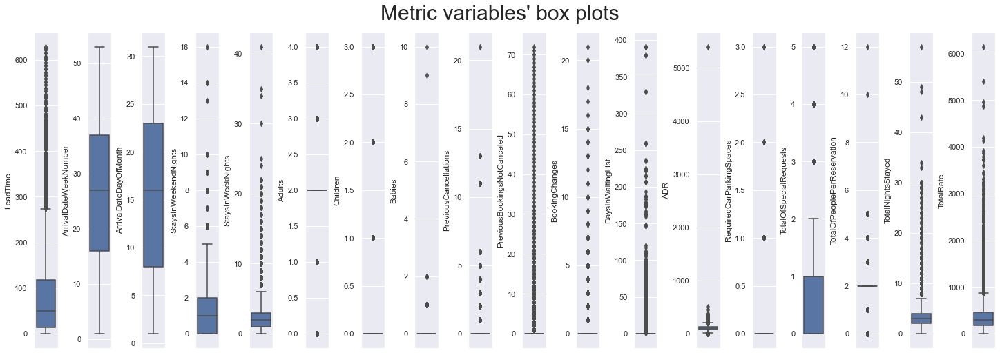

In [61]:
sns.set()
# Prepare figure
fig, axes = plt.subplots(1, len(metric_features), figsize=(20,7), constrained_layout=True)  
# Plot data
for ax, f in zip(axes, metric_features):
    sns.boxplot(y=f, data=df[metric_features], ax=ax)

# Layout
plt.suptitle("Metric variables' box plots", fontsize=30)

plt.show()

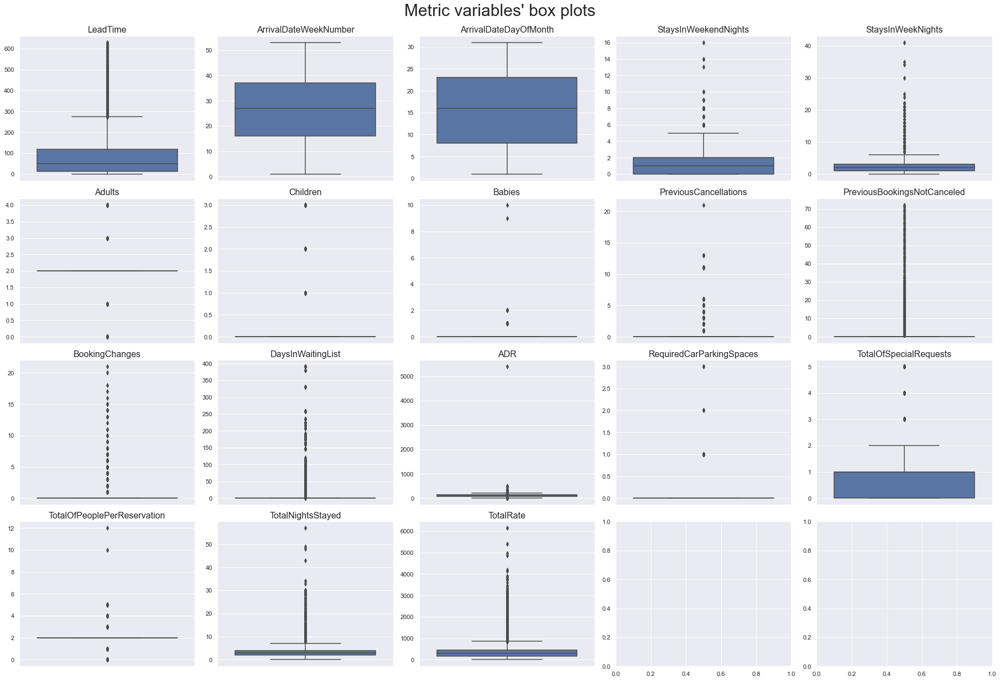

In [62]:
sns.set()
# Prepare figure
fig, axes = plt.subplots(4, 5, figsize=(25, 17), constrained_layout=True)
    
# Plot data
for ax, f in zip(axes.flat, df[metric_features].columns):
    sns.boxplot(y=f, data=df[metric_features], ax=ax)
    ax.set_title(f, size=16) # even because of aleasing
    ax.set_ylabel("")

# Layout
plt.suptitle("Metric variables' box plots", fontsize=30)

plt.show()

In [63]:
# Removing visual outliers
outliers = ((df['StaysInWeekendNights']>12) | (df['StaysInWeekNights']>40)| (df['PreviousCancellations']>20)
            | (df['DaysInWaitingList']>300)| (df['Babies']>8)| (df['ADR']>1000)| (df['DaysInWaitingList']>300))
outliers_df=df.loc[outliers]
new_df = df.loc[~outliers]

In [64]:
print("There were removed",round(100-(new_df.shape[0]/df.shape[0]*100),3),"% of all observations.")

There were removed 0.037 % of all observations.


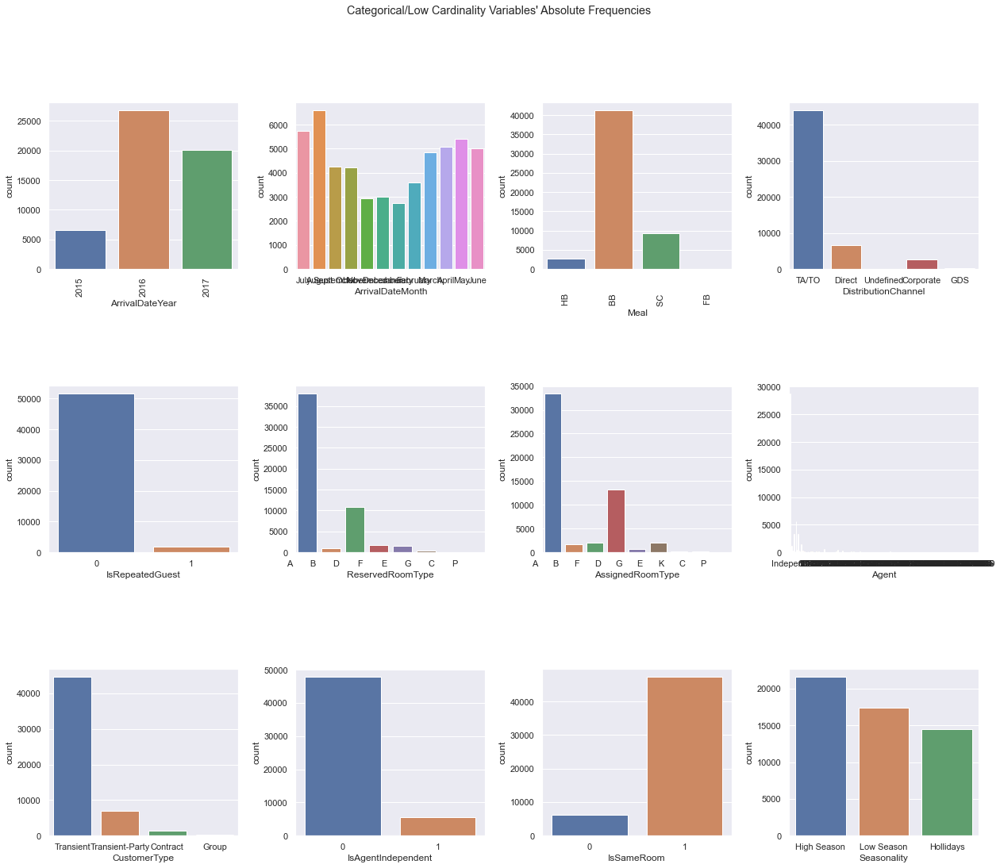

In [65]:
sns.set()

features = non_metric_features 
# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(3, ceil(len(features) / 3), figsize=(21, 17))

# Plot data
# Iterate across axes objects and associate each bar plot:
for ax, feat in zip(axes.flatten(), features):
    sns.countplot(x=df[feat], ax=ax)

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title)
# Rotating X-axis labels
axes.flatten()[0].tick_params(axis='x', labelrotation = 90)
axes.flatten()[2].tick_params(axis='x', labelrotation = 90)
plt.subplots_adjust(wspace=0.3, hspace=0.7)

plt.show()

In [66]:
new_df.head().transpose()

,0,1,2,3,4
IsCanceled,0,1,1,1,1
LeadTime,6,88,65,92,100
ArrivalDateYear,2015,2015,2015,2015,2015
ArrivalDateMonth,July,July,July,July,July
ArrivalDateWeekNumber,27,27,27,27,27
ArrivalDateDayOfMonth,1,1,1,1,2
StaysInWeekendNights,0,0,0,2,0
StaysInWeekNights,2,4,4,4,2
Adults,1,2,1,2,2
Children,0,0,0,0,0


In [67]:
new_df=new_df.drop(columns={'ReservedRoomType','AssignedRoomType','Agent','ArrivalDateMonth'})

In [68]:
non_metric_features=["ArrivalDateYear","Meal","DistributionChannel", "CustomerType","Seasonality"]
binary=["IsAgentIndependent","IsSameRoom","IsRepeatedGuest"]
date=["ArrivalDate"]

In [69]:
metric_features = new_df.columns.drop(non_metric_features).drop(date).drop("IsCanceled").drop(binary).to_list()
metric_features

['LeadTime',
 'ArrivalDateWeekNumber',
 'ArrivalDateDayOfMonth',
 'StaysInWeekendNights',
 'StaysInWeekNights',
 'Adults',
 'Children',
 'Babies',
 'PreviousCancellations',
 'PreviousBookingsNotCanceled',
 'BookingChanges',
 'DaysInWaitingList',
 'ADR',
 'RequiredCarParkingSpaces',
 'TotalOfSpecialRequests',
 'TotalOfPeoplePerReservation',
 'TotalNightsStayed',
 'TotalRate']

### Encoding 

In [70]:
df_ohc = new_df.copy()

In [71]:
# Use OneHotEncoder to encode the categorical features. Get feature names and create a DataFrame 
# with the one-hot encoded categorical features (pass feature names)
ohc = OneHotEncoder(sparse=False, drop="first")
ohc_feat = ohc.fit_transform(df_ohc[non_metric_features])
ohc_feat_names = ohc.get_feature_names()
ohc_df = pd.DataFrame(ohc_feat, index=df_ohc.index, columns=ohc_feat_names)  
ohc_df

,x0_2016,x0_2017,x1_FB,x1_HB,x1_SC,x2_Direct,x2_GDS,x2_TA/TO,x2_Undefined,x3_Group,x3_Transient,x3_Transient-Party,x4_Hollidays,x4_Low Season
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79325,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
79326,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
79327,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
79328,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


In [72]:
# Reassigning df to contain ohc variables
df_ohc = pd.concat([df_ohc, ohc_df], axis=1)
df_ohc=df_ohc.drop(columns={'ArrivalDateYear','Meal','DistributionChannel',
 'CustomerType', 'Seasonality'})

In [73]:
df_sel = df_ohc.copy()

In [74]:
df_sel.columns

Index(['IsCanceled', 'LeadTime', 'ArrivalDateWeekNumber',
       'ArrivalDateDayOfMonth', 'StaysInWeekendNights', 'StaysInWeekNights',
       'Adults', 'Children', 'Babies', 'IsRepeatedGuest',
       'PreviousCancellations', 'PreviousBookingsNotCanceled',
       'BookingChanges', 'DaysInWaitingList', 'ADR',
       'RequiredCarParkingSpaces', 'TotalOfSpecialRequests', 'ArrivalDate',
       'TotalOfPeoplePerReservation', 'IsAgentIndependent', 'IsSameRoom',
       'TotalNightsStayed', 'TotalRate', 'x0_2016', 'x0_2017', 'x1_FB       ',
       'x1_HB       ', 'x1_SC       ', 'x2_Direct', 'x2_GDS', 'x2_TA/TO',
       'x2_Undefined', 'x3_Group', 'x3_Transient', 'x3_Transient-Party',
       'x4_Hollidays', 'x4_Low Season'],
      dtype='object')

In [75]:
non_metric_features_1=df_sel.columns[df_sel.columns.str.startswith('x')].tolist()
non_metric_features=non_metric_features_1+binary

In [76]:
metric_features

['LeadTime',
 'ArrivalDateWeekNumber',
 'ArrivalDateDayOfMonth',
 'StaysInWeekendNights',
 'StaysInWeekNights',
 'Adults',
 'Children',
 'Babies',
 'PreviousCancellations',
 'PreviousBookingsNotCanceled',
 'BookingChanges',
 'DaysInWaitingList',
 'ADR',
 'RequiredCarParkingSpaces',
 'TotalOfSpecialRequests',
 'TotalOfPeoplePerReservation',
 'TotalNightsStayed',
 'TotalRate']

In [77]:
df_sel[metric_features]

,LeadTime,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,PreviousCancellations,PreviousBookingsNotCanceled,BookingChanges,DaysInWaitingList,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,TotalOfPeoplePerReservation,TotalNightsStayed,TotalRate
0,6,27,1,0,2,1,0.0,0,0,0,0,0,0.00,0,0,1.0,2,0.00
1,88,27,1,0,4,2,0.0,0,0,0,0,0,76.50,0,1,2.0,4,306.00
2,65,27,1,0,4,1,0.0,0,0,0,0,0,68.00,0,1,1.0,4,272.00
3,92,27,1,2,4,2,0.0,0,0,0,0,0,76.50,0,2,2.0,6,459.00
4,100,27,2,0,2,2,0.0,0,0,0,0,0,76.50,0,1,2.0,2,153.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79325,23,35,30,2,5,2,0.0,0,0,0,0,0,96.14,0,0,2.0,7,672.98
79326,102,35,31,2,5,3,0.0,0,0,0,0,0,225.43,0,2,3.0,7,1578.01
79327,34,35,31,2,5,2,0.0,0,0,0,0,0,157.71,0,4,2.0,7,1103.97
79328,109,35,31,2,5,2,0.0,0,0,0,0,0,104.40,0,0,2.0,7,730.80


### Standardization

In [78]:
df_minmax = df_sel.copy()
# Normalizing using min max
scaler = MinMaxScaler()
scaled_feat = scaler.fit_transform(df_minmax[metric_features])
scaled_feat

array([[0.00953895, 0.5       , 0.        , ..., 0.2       , 0.05882353,
        0.        ],
       [0.13990461, 0.5       , 0.        , ..., 0.4       , 0.11764706,
        0.04977228],
       [0.10333863, 0.5       , 0.        , ..., 0.2       , 0.11764706,
        0.04424203],
       ...,
       [0.05405405, 0.65384615, 1.        , ..., 0.4       , 0.20588235,
        0.17956571],
       [0.17329094, 0.65384615, 1.        , ..., 0.4       , 0.20588235,
        0.11886792],
       [0.32591415, 0.65384615, 0.93333333, ..., 0.4       , 0.26470588,
        0.22134027]])

In [79]:
df_minmax[metric_features] = scaled_feat
df_minmax.head()

,IsCanceled,LeadTime,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,IsRepeatedGuest,...,x1_SC,x2_Direct,x2_GDS,x2_TA/TO,x2_Undefined,x3_Group,x3_Transient,x3_Transient-Party,x4_Hollidays,x4_Low Season
0,0,0.009539,0.5,0.000000,0.0,0.08,0.25,0.0,0.0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1,0.139905,0.5,0.000000,0.0,0.16,0.50,0.0,0.0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
2,1,0.103339,0.5,0.000000,0.0,0.16,0.25,0.0,0.0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
3,1,0.146264,0.5,0.000000,0.2,0.16,0.50,0.0,0.0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
4,1,0.158983,0.5,0.033333,0.0,0.08,0.50,0.0,0.0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


In [80]:
# Checking max and min of minmaxed variables
df_minmax[metric_features].describe().round(4)

,LeadTime,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,PreviousCancellations,PreviousBookingsNotCanceled,BookingChanges,DaysInWaitingList,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,TotalOfPeoplePerReservation,TotalNightsStayed,TotalRate
count,53408.0000,53408.0000,53408.0000,53408.0000,53408.0000,53408.0000,53408.0000,53408.0000,53408.0000,53408.0000,53408.0000,53408.0000,53408.0000,53408.0000,53408.0000,53408.0000,53408.0000,53408.0000
mean,0.1234,0.4930,0.4918,0.0871,0.0909,0.4691,0.0440,0.0035,0.0027,0.0027,0.0123,0.0036,0.2175,0.0119,0.1422,0.4031,0.0925,0.0572
std,0.1303,0.2613,0.2934,0.0906,0.0637,0.1360,0.1474,0.0423,0.0278,0.0283,0.0347,0.0407,0.0829,0.0621,0.1667,0.1403,0.0603,0.0440
min,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0223,0.2885,0.2333,0.0000,0.0400,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1647,0.0000,0.0000,0.4000,0.0588,0.0286
50%,0.0795,0.5000,0.5000,0.1000,0.0800,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.2065,0.0000,0.2000,0.4000,0.0882,0.0486
75%,0.1876,0.6923,0.7333,0.2000,0.1200,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.2627,0.0000,0.2000,0.4000,0.1176,0.0734
max,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


In [81]:
df_minmax.head()

,IsCanceled,LeadTime,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,IsRepeatedGuest,...,x1_SC,x2_Direct,x2_GDS,x2_TA/TO,x2_Undefined,x3_Group,x3_Transient,x3_Transient-Party,x4_Hollidays,x4_Low Season
0,0,0.009539,0.5,0.000000,0.0,0.08,0.25,0.0,0.0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1,0.139905,0.5,0.000000,0.0,0.16,0.50,0.0,0.0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
2,1,0.103339,0.5,0.000000,0.0,0.16,0.25,0.0,0.0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
3,1,0.146264,0.5,0.000000,0.2,0.16,0.50,0.0,0.0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
4,1,0.158983,0.5,0.033333,0.0,0.08,0.50,0.0,0.0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


In [82]:
df_minmax[metric_features]

,LeadTime,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,PreviousCancellations,PreviousBookingsNotCanceled,BookingChanges,DaysInWaitingList,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,TotalOfPeoplePerReservation,TotalNightsStayed,TotalRate
0,0.009539,0.500000,0.000000,0.0,0.08,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.2,0.058824,0.000000
1,0.139905,0.500000,0.000000,0.0,0.16,0.50,0.0,0.0,0.0,0.0,0.0,0.0,0.150000,0.0,0.2,0.4,0.117647,0.049772
2,0.103339,0.500000,0.000000,0.0,0.16,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.133333,0.0,0.2,0.2,0.117647,0.044242
3,0.146264,0.500000,0.000000,0.2,0.16,0.50,0.0,0.0,0.0,0.0,0.0,0.0,0.150000,0.0,0.4,0.4,0.176471,0.074658
4,0.158983,0.500000,0.033333,0.0,0.08,0.50,0.0,0.0,0.0,0.0,0.0,0.0,0.150000,0.0,0.2,0.4,0.058824,0.024886
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79325,0.036566,0.653846,0.966667,0.2,0.20,0.50,0.0,0.0,0.0,0.0,0.0,0.0,0.188510,0.0,0.0,0.4,0.205882,0.109463
79326,0.162162,0.653846,1.000000,0.2,0.20,0.75,0.0,0.0,0.0,0.0,0.0,0.0,0.442020,0.0,0.4,0.6,0.205882,0.256670
79327,0.054054,0.653846,1.000000,0.2,0.20,0.50,0.0,0.0,0.0,0.0,0.0,0.0,0.309235,0.0,0.8,0.4,0.205882,0.179566
79328,0.173291,0.653846,1.000000,0.2,0.20,0.50,0.0,0.0,0.0,0.0,0.0,0.0,0.204706,0.0,0.0,0.4,0.205882,0.118868


### Feature Selection

In [83]:
target=df_minmax["IsCanceled"]
df_minmax=df_minmax.drop(columns={"IsCanceled"})

In [84]:
df_minmax.head().transpose()

,0,1,2,3,4
LeadTime,0.00953895,0.139905,0.103339,0.146264,0.158983
ArrivalDateWeekNumber,0.5,0.5,0.5,0.5,0.5
ArrivalDateDayOfMonth,0,0,0,0,0.0333333
StaysInWeekendNights,0,0,0,0.2,0
StaysInWeekNights,0.08,0.16,0.16,0.16,0.08
Adults,0.25,0.5,0.25,0.5,0.5
Children,0,0,0,0,0
Babies,0,0,0,0,0
IsRepeatedGuest,0,0,0,0,0
PreviousCancellations,0,0,0,0,0


## Metric Features

### Correlation

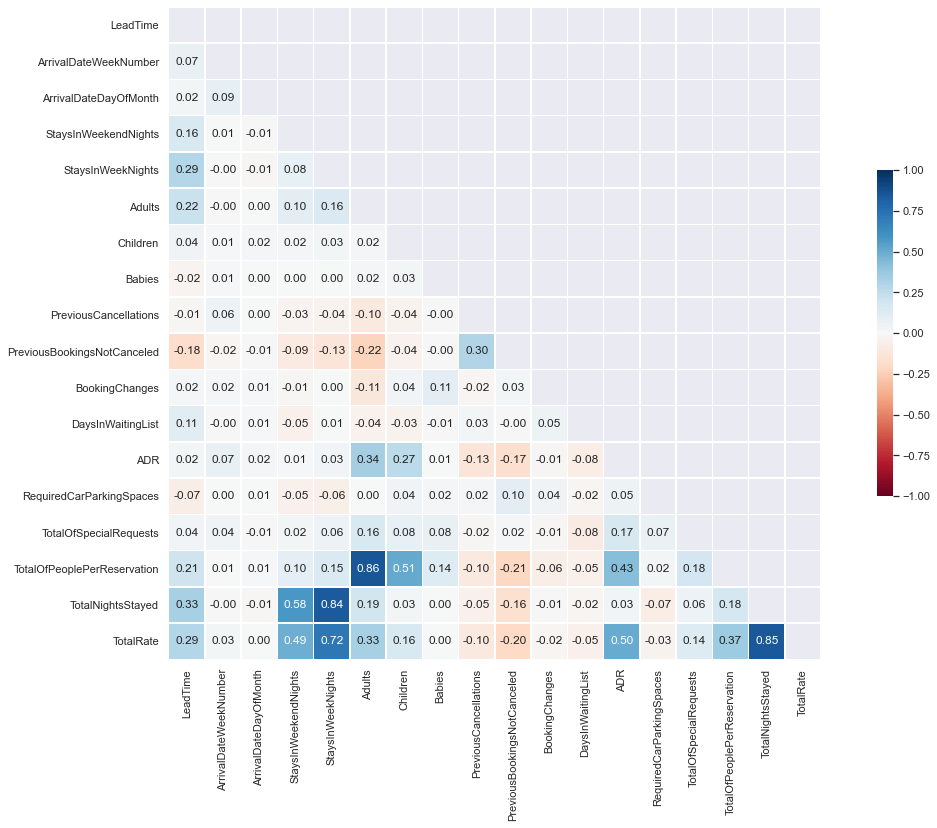

In [85]:
# Compute the correlation matrix - Spearman
corr = df_minmax[metric_features].corr(method='spearman')

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 12))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask = mask, cmap = 'RdBu', vmax = 1, vmin=-1, center = 0,
            square = True, annot = True,fmt=".2f", linewidths = .5, cbar_kws = {"shrink": .5})

### RFE

In [86]:
model = LogisticRegression()

In [87]:
rfe = RFE(estimator = model)

In [88]:
X_rfe = rfe.fit_transform(X = df_minmax[metric_features], y = target) 

C:\Users\sorai\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [89]:
model.fit(X = X_rfe,y = target)

LogisticRegression()

In [90]:
rfe.support_

array([ True, False, False, False,  True, False, False, False,  True,
        True,  True, False,  True,  True,  True, False, False,  True])

In [91]:
rfe.ranking_

array([ 1,  5, 10,  8,  1,  4,  7,  9,  1,  1,  1,  2,  1,  1,  1,  6,  3,
        1])

In [92]:
selected_features = pd.Series(rfe.support_, index = metric_features)
selected_features[selected_features==True]

LeadTime                       True
StaysInWeekNights              True
PreviousCancellations          True
PreviousBookingsNotCanceled    True
BookingChanges                 True
ADR                            True
RequiredCarParkingSpaces       True
TotalOfSpecialRequests         True
TotalRate                      True
dtype: bool

### LASSO

In [93]:
reg = LassoCV()

In [94]:
reg.fit(X=df_minmax[metric_features], y=target)

LassoCV()

In [95]:
coef = pd.Series(reg.coef_, index = df_minmax[metric_features].columns)

In [96]:
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

Lasso picked 14 variables and eliminated the other 4 variables


In [97]:
coef.sort_values()

BookingChanges                -1.102880
RequiredCarParkingSpaces      -0.714257
TotalOfSpecialRequests        -0.496298
PreviousBookingsNotCanceled   -0.176918
DaysInWaitingList             -0.162615
ArrivalDateWeekNumber         -0.033818
ArrivalDateDayOfMonth         -0.000000
StaysInWeekendNights           0.000000
Children                       0.000000
Babies                         0.000000
TotalNightsStayed              0.017229
TotalOfPeoplePerReservation    0.043331
Adults                         0.069548
StaysInWeekNights              0.259035
ADR                            0.478986
TotalRate                      0.521974
LeadTime                       0.629646
PreviousCancellations          0.764346
dtype: float64

In [98]:
print("Best score using built-in LassoCV: %f" %reg.score(X = df_minmax[metric_features], y = target))

Best score using built-in LassoCV: 0.114280


In [99]:
def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(10,10))
    imp_coef.plot(kind = "barh")
    plt.title("Feature importance using " + name + " Model")
    plt.show()

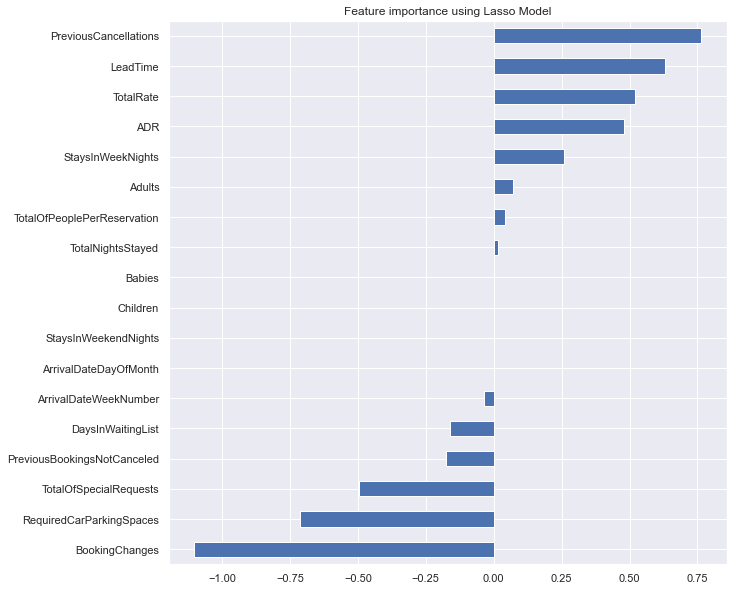

In [100]:
plot_importance(coef,'Lasso')

### Ridge

In [101]:
ridge = RidgeCV()

In [102]:
ridge.fit(X = df_minmax[metric_features], y = target)

RidgeCV(alphas=array([ 0.1,  1. , 10. ]))

In [103]:
coef_ridge = pd.Series(ridge.coef_, index = df_minmax[metric_features].columns)
coef_ridge.sort_values()

BookingChanges                -1.246824
RequiredCarParkingSpaces      -0.750100
PreviousBookingsNotCanceled   -0.646887
TotalOfSpecialRequests        -0.502964
DaysInWaitingList             -0.288348
StaysInWeekendNights          -0.041694
ArrivalDateWeekNumber         -0.037844
Children                      -0.007162
ArrivalDateDayOfMonth          0.000294
Babies                         0.017833
TotalOfPeoplePerReservation    0.048035
Adults                         0.056499
TotalNightsStayed              0.116584
StaysInWeekNights              0.175232
ADR                            0.483320
LeadTime                       0.640796
TotalRate                      0.642411
PreviousCancellations          1.253677
dtype: float64

In [104]:
print("Best score using built-in RidgeCV: %f" %ridge.score(df_minmax[metric_features], target))

Best score using built-in RidgeCV: 0.115736


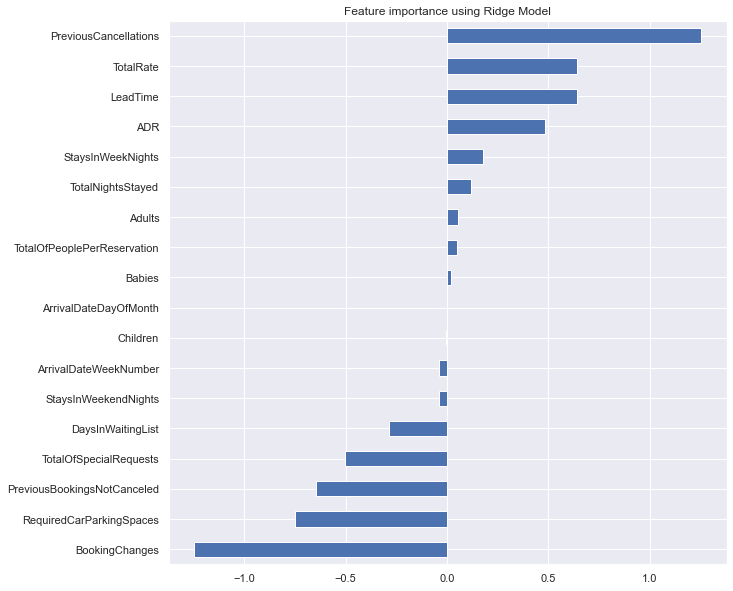

In [105]:
plot_importance(coef_ridge,'Ridge')

### ANOVA

In [106]:
# Create an SelectKBest object to select features with best ANOVA F-Values
fvalue_selector = SelectKBest(f_classif)

# Apply the SelectKBest object to the features and target
X_kbest = fvalue_selector.fit_transform(df_minmax[metric_features], target)

In [107]:
# Get columns to keep 
cols = fvalue_selector.get_support(indices=True)
features_to_keep = df_minmax.iloc[:,cols]
features_to_keep.columns

Index(['LeadTime', 'StaysInWeekNights', 'Adults',
       'PreviousBookingsNotCanceled', 'DaysInWaitingList', 'ADR',
       'RequiredCarParkingSpaces', 'TotalOfSpecialRequests', 'ArrivalDate',
       'TotalOfPeoplePerReservation'],
      dtype='object')

### GINI Importance | Entropy Importance

In [108]:
# aux_df is new_df without date columns
aux_df = df_minmax.drop(columns={'ArrivalDate'})
aux_df.columns

Index(['LeadTime', 'ArrivalDateWeekNumber', 'ArrivalDateDayOfMonth',
       'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children',
       'Babies', 'IsRepeatedGuest', 'PreviousCancellations',
       'PreviousBookingsNotCanceled', 'BookingChanges', 'DaysInWaitingList',
       'ADR', 'RequiredCarParkingSpaces', 'TotalOfSpecialRequests',
       'TotalOfPeoplePerReservation', 'IsAgentIndependent', 'IsSameRoom',
       'TotalNightsStayed', 'TotalRate', 'x0_2016', 'x0_2017', 'x1_FB       ',
       'x1_HB       ', 'x1_SC       ', 'x2_Direct', 'x2_GDS', 'x2_TA/TO',
       'x2_Undefined', 'x3_Group', 'x3_Transient', 'x3_Transient-Party',
       'x4_Hollidays', 'x4_Low Season'],
      dtype='object')

In [109]:
gini_importance = DecisionTreeClassifier().fit(aux_df, target).feature_importances_
entropy_importance = DecisionTreeClassifier(criterion='entropy').fit(aux_df, target).feature_importances_

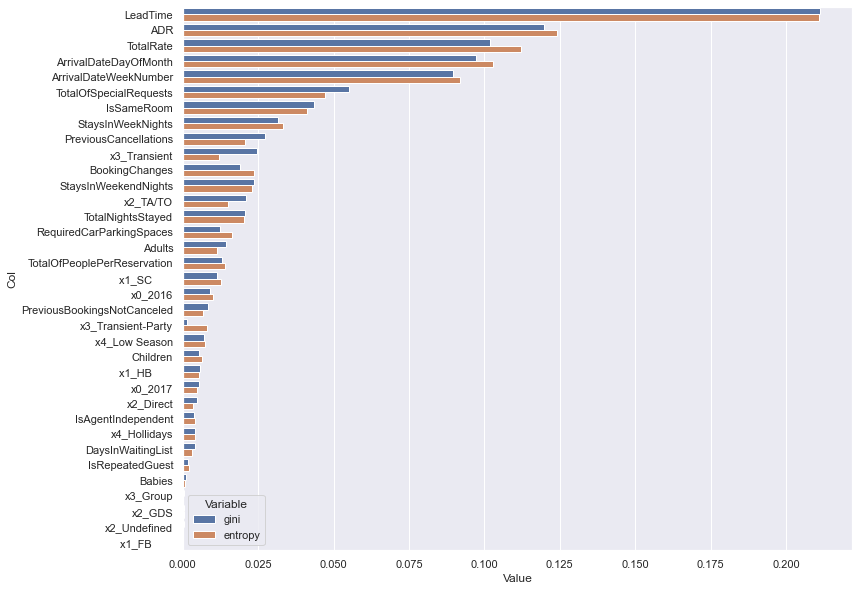

In [110]:
zippy = pd.DataFrame(zip(gini_importance, entropy_importance), columns = ['gini','entropy'])
zippy['col'] = aux_df.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(12,10))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

In [111]:
mse_importance = DecisionTreeRegressor().fit(aux_df, target).feature_importances_
mae_importance = DecisionTreeRegressor(criterion='mae').fit(aux_df, target).feature_importances_
friedman_importance = DecisionTreeRegressor(criterion='friedman_mse').fit(aux_df, target).feature_importances_

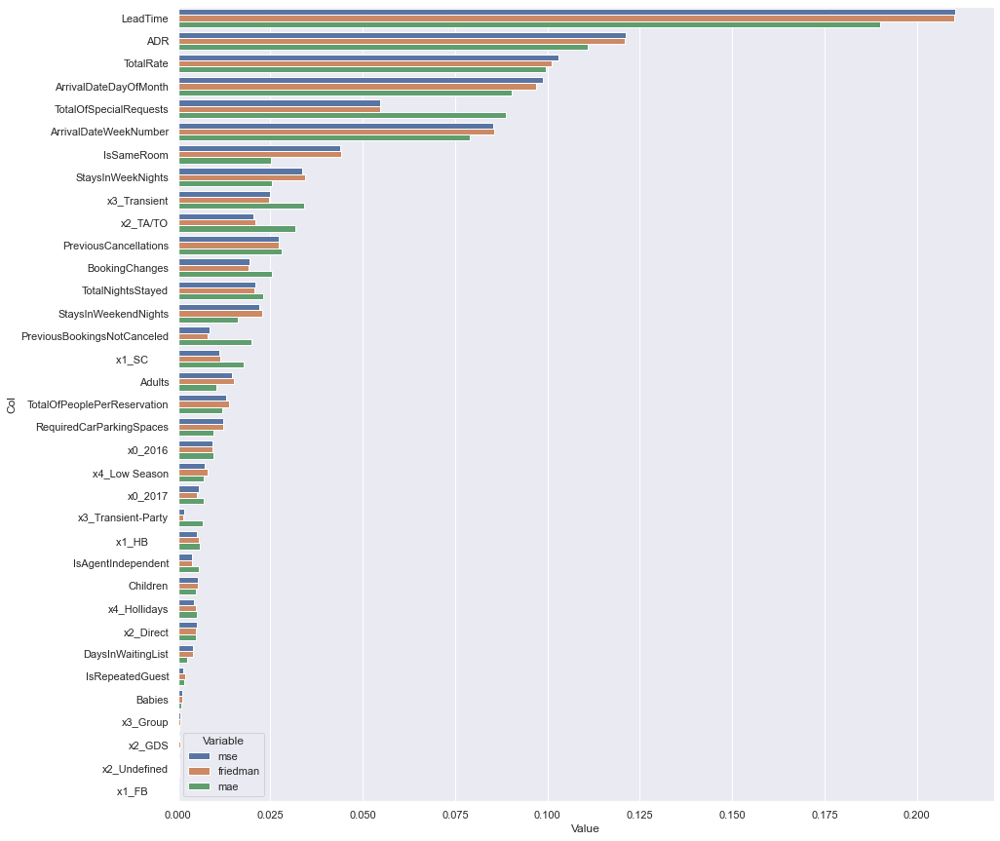

In [112]:
zippy = pd.DataFrame(zip(mse_importance, mae_importance, friedman_importance), columns = ['mse','mae','friedman'])
zippy['col'] = aux_df.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(15,15))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

## Non Metric Features

### Chi-Square

In [113]:
chi_scores = chi2(df_minmax[non_metric_features], target)
chi_scores[1]

array([8.36234403e-004, 1.53042306e-034, 3.91194367e-001, 8.16451928e-001,
       5.92578056e-032, 4.33666452e-124, 2.91081416e-003, 3.47342826e-045,
       2.26826468e-003, 2.84853470e-014, 4.41936881e-028, 4.98967439e-130,
       1.34099142e-002, 3.32017228e-005, 8.00279111e-135, 5.22617802e-052,
       1.76198434e-074])

In [114]:
p_values = pd.Series(chi_scores[1],index = non_metric_features)
p_values.sort_values(ascending = False , inplace = True)

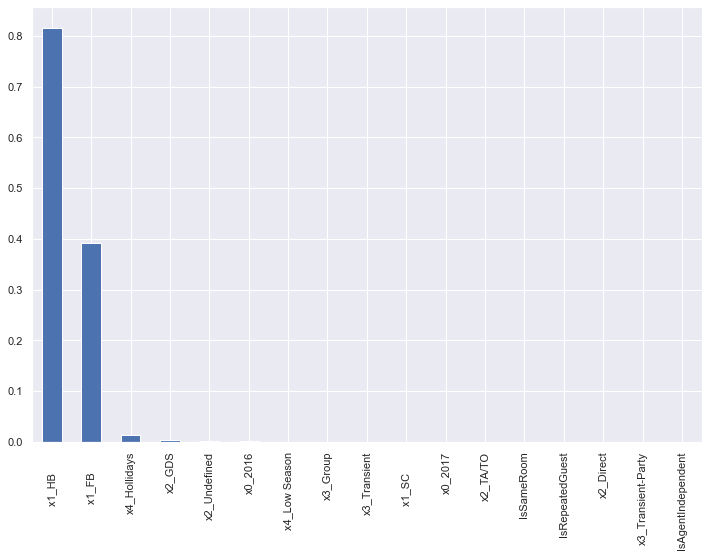

In [115]:
plt.figure(figsize=(12,8))
p_values.plot.bar()

In [116]:
chi2_features = SelectKBest(chi2,k=10)
best_features = chi2_features.fit_transform(df_minmax[non_metric_features],target)
cols = chi2_features.get_support(indices=True)

# Selected features by Chi-Square
features_to_keep = df_minmax.iloc[:,cols]
features_to_keep.columns

Index(['ArrivalDateWeekNumber', 'StaysInWeekNights', 'Adults', 'Babies',
       'PreviousCancellations', 'PreviousBookingsNotCanceled',
       'BookingChanges', 'RequiredCarParkingSpaces', 'TotalOfSpecialRequests',
       'ArrivalDate'],
      dtype='object')

### Mutual Information

In [117]:
threshold = 15  # the number of most relevant features
high_score_features = []
h_score=[]
feature_scores = mutual_info_classif(df_minmax[non_metric_features], target, random_state=0)
for score, f_name in sorted(zip(feature_scores, df_minmax[non_metric_features].columns), reverse=True)[:threshold]:
        print(f_name, score)
        high_score_features.append(f_name)
        h_score.append(score)
high_score = df_minmax[high_score_features]
print(high_score.columns)

IsSameRoom 0.032947170846906015
x2_TA/TO 0.01584466984421451
x3_Transient 0.010118387106276439
IsAgentIndependent 0.009937424098673597
x2_Direct 0.006732706910495878
x3_Transient-Party 0.0052665413028585295
x2_GDS 0.0034900909497432853
x2_Undefined 0.00265423986687896
IsRepeatedGuest 0.002625009572105208
x4_Low Season 0.002323034264938295
x0_2017 0.001935700545195873
x1_SC        0.0008392178448846099
x1_FB        0.0001776580623744639
x4_Hollidays 5.9560569034111666e-05
x3_Group 0.0
Index(['IsSameRoom', 'x2_TA/TO', 'x3_Transient', 'IsAgentIndependent',
       'x2_Direct', 'x3_Transient-Party', 'x2_GDS', 'x2_Undefined',
       'IsRepeatedGuest', 'x4_Low Season', 'x0_2017', 'x1_SC       ',
       'x1_FB       ', 'x4_Hollidays', 'x3_Group'],
      dtype='object')


### Feature Importance - Tree based classifiers

[0.04113064 0.04567084 0.00119346 0.01137801 0.02265094 0.04793937
 0.00161322 0.1347618  0.00231113 0.00986592 0.09884385 0.06109595
 0.01941077 0.02054494 0.06079098 0.37489391 0.04590426]


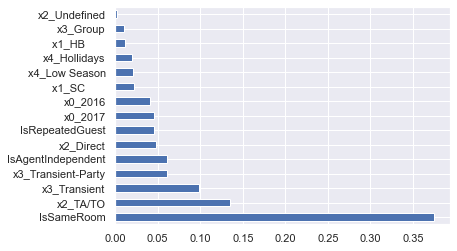

In [118]:
model = ExtraTreesClassifier()
model.fit(df_minmax[non_metric_features], target)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=df_minmax[non_metric_features].columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

### GINI Importance | Entropy Importance

In [119]:
gini_importance = DecisionTreeClassifier().fit(aux_df[non_metric_features], target).feature_importances_
entropy_importance = DecisionTreeClassifier(criterion='entropy').fit(aux_df[non_metric_features], target).feature_importances_

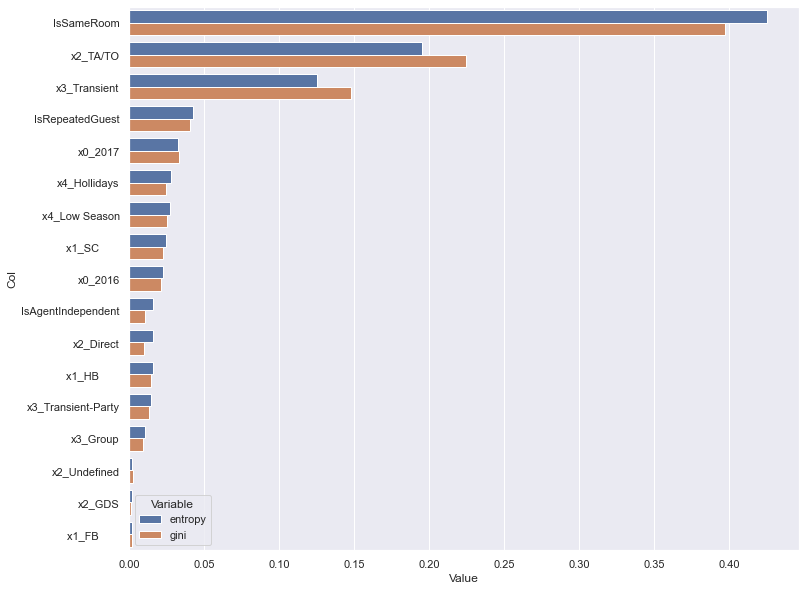

In [120]:
zippy = pd.DataFrame(zip(gini_importance, entropy_importance), columns = ['gini','entropy'])
zippy['col'] = aux_df[non_metric_features].columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(12,10))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

In [121]:
mse_importance = DecisionTreeRegressor().fit(aux_df[non_metric_features], target).feature_importances_
mae_importance = DecisionTreeRegressor(criterion='mae').fit(aux_df[non_metric_features], target).feature_importances_
friedman_importance = DecisionTreeRegressor(criterion='friedman_mse').fit(aux_df[non_metric_features], target).feature_importances_

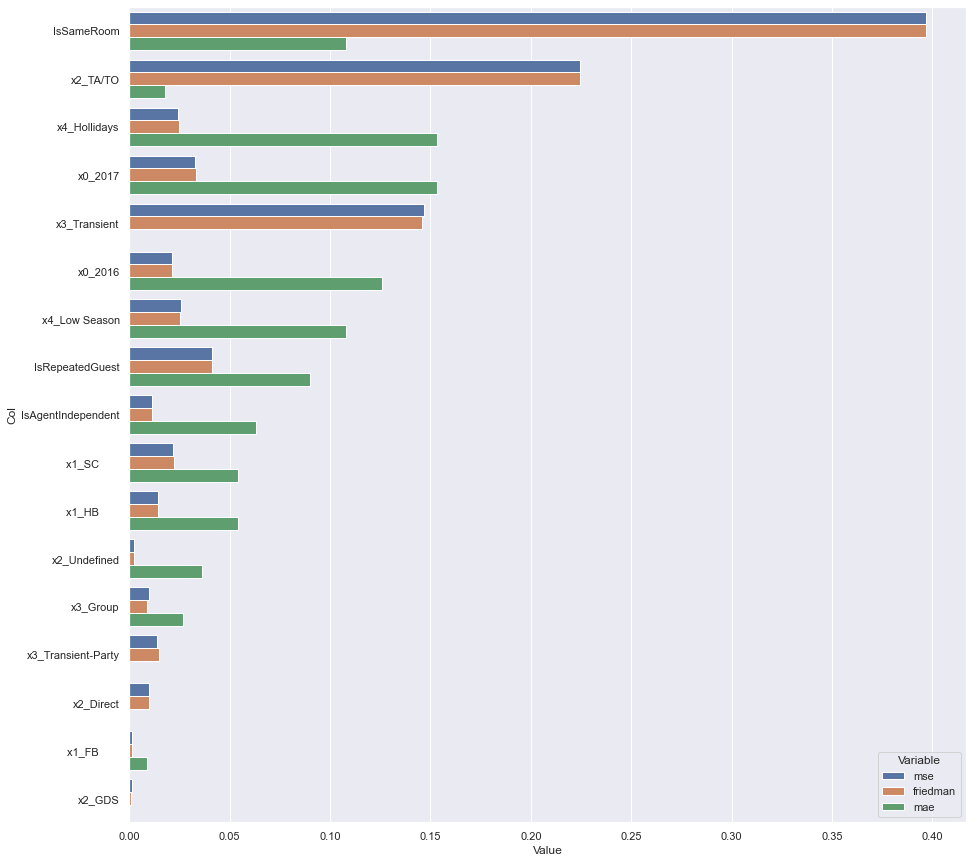

In [122]:
zippy = pd.DataFrame(zip(mse_importance, mae_importance, friedman_importance), columns = ['mse','mae','friedman'])
zippy['col'] = aux_df[non_metric_features].columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(15,15))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

## Modelling

In [123]:
selected_variables=["TotalRate",'PreviousCancellations',"LeadTime","BookingChanges","ADR","TotalOfSpecialRequests",
                    "x2_TA/TO","IsSameRoom","x3_Transient","x0_2017","IsRepeatedGuest"]

In [124]:
hotel=df_sel[selected_variables]

In [125]:
# Proportion of the zeros and ones in the target 
target.value_counts(normalize=True)

0    0.69967
1    0.30033
Name: IsCanceled, dtype: float64

### Balancing the dataset

In [126]:
# define pipeline
adasyn = ADASYN(sampling_strategy='minority', random_state=15, n_neighbors=5)
hotel_und, target_und = adasyn.fit_resample(hotel, target)

# Proportion of zeros and ones in the target after oversampling ADASYN
target_und.value_counts(normalize=True)

0    0.509323
1    0.490677
Name: IsCanceled, dtype: float64

### Generate Test design

In [127]:
X_train, X_val, y_train, y_val = train_test_split(hotel_und,target_und,test_size = 0.3,random_state = 42,shuffle=True,stratify=target_und)

### Build and assess model

In [128]:
# Define the Decision Tree model
dt = DecisionTreeClassifier(random_state=42)

# Define the grid to explore
grid = {
    "criterion": ["entropy", "gini"],
    "splitter": ["random", "best"],
    "max_depth": [3, 6, 9],
    "min_samples_split": [0.005, 0.01, 0.05],
    "max_features": [None, "sqrt","log2"],
    "class_weight": [None, 'balanced', {0: 1, 1: 2}]
    }

In [129]:
# Instatiating GridSearch
splitter = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
gscv = GridSearchCV(dt, grid, cv=splitter, scoring='precision', refit=True, verbose=-1, n_jobs=-1)

# Get ID of grid search
# id_num = input("Insert GridSearch ID number: ")
id_num = 1

In [130]:
# Grid Search and model training
gscv.fit(X_train, y_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 272 tasks      | elapsed:   13.8s
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:   26.6s
[Parallel(n_jobs=-1)]: Done 1136 tasks      | elapsed:   48.1s
[Parallel(n_jobs=-1)]: Done 1620 out of 1620 | elapsed:  1.1min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=0, shuffle=True),
             estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'class_weight': [None, 'balanced', {0: 1, 1: 2}],
                         'criterion': ['entropy', 'gini'],
                         'max_depth': [3, 6, 9],
                         'max_features': [None, 'sqrt', 'log2'],
                         'min_samples_split': [0.005, 0.01, 0.05],
                         'splitter': ['random', 'best']},
             scoring='precision', verbose=-1)

In [131]:
# Saving cv_results for specific Grid Search run
score_summary = pd.DataFrame(gscv.cv_results_).sort_values(by="mean_test_score", ascending=False)

# Saving best model
best_dt = gscv.best_estimator_

# Get test set y_pred and evaluate on precision
y_test_pred = best_dt.predict(X_val)

print("The best model has a mean cross-validated precision of {0:.3f} and a test set precision of {1:.3f}".\
      format(gscv.best_score_, precision_score(y_val, y_test_pred)))
print("\nThe hyper-parameters selected are:\n", gscv.best_params_)

The best model has a mean cross-validated precision of 0.815 and a test set precision of 0.817

The hyper-parameters selected are:
 {'class_weight': None, 'criterion': 'entropy', 'max_depth': 6, 'max_features': None, 'min_samples_split': 0.01, 'splitter': 'best'}


In [132]:
# Test set classification report
print(classification_report(y_val, y_test_pred))

              precision    recall  f1-score   support

           0       0.73      0.85      0.79     11211
           1       0.82      0.68      0.74     10800

    accuracy                           0.77     22011
   macro avg       0.78      0.77      0.77     22011
weighted avg       0.77      0.77      0.77     22011



In [133]:
# Test set confusion matrix
pd.DataFrame(data=confusion_matrix(y_val, y_test_pred), 
             index=pd.Index(y_train.unique(), name="True"), 
             columns=pd.Index(y_train.unique(), name="Pred"))

Pred,1,0
True,,
1,9560,1651
0,3452,7348


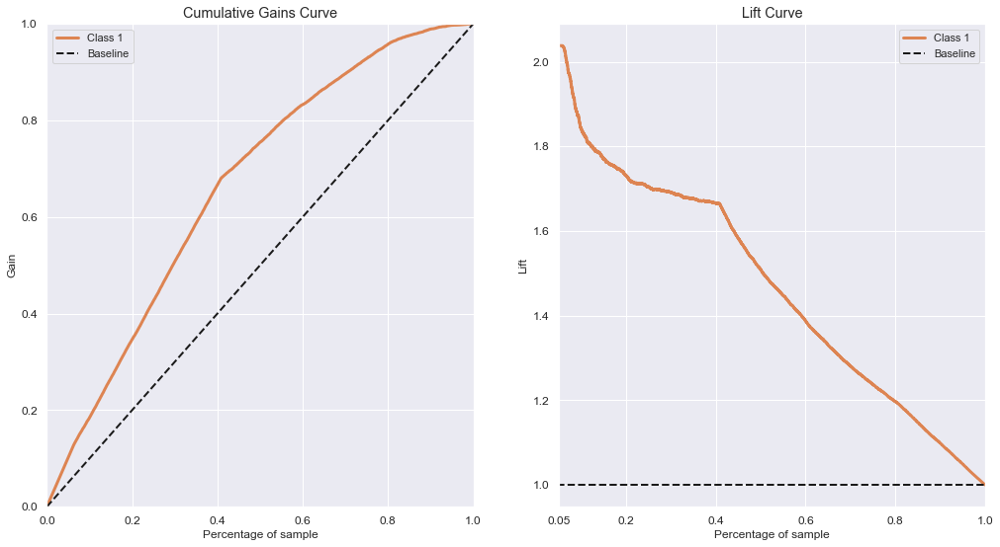

In [134]:
# Plot lift curves
predicted_probas = best_dt.predict_proba(X_val)

# figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(17, 9))
plot_cumulative_gain(y_val, predicted_probas, ax=ax1)
plot_lift_curve(y_val, predicted_probas, ax=ax2)  # Lift is a measure of the effectiveness of a predictive model
                                                   # calculated as the ratio between the results obtained with and 
                                                   # without the predictive model.
# properties
ax2.set_xlim(0.05, 1)
ax2.set_xticks([0.05, 0.2, 0.4, 0.6, 0.8, 1.0])
ax2.set_xticklabels([0.05, 0.2, 0.4, 0.6, 0.8, 1.0])
for ax in (ax1, ax2):
    ax.axes.lines[0].remove()
    ax.get_legend().remove()
    ax.legend()

plt.show()

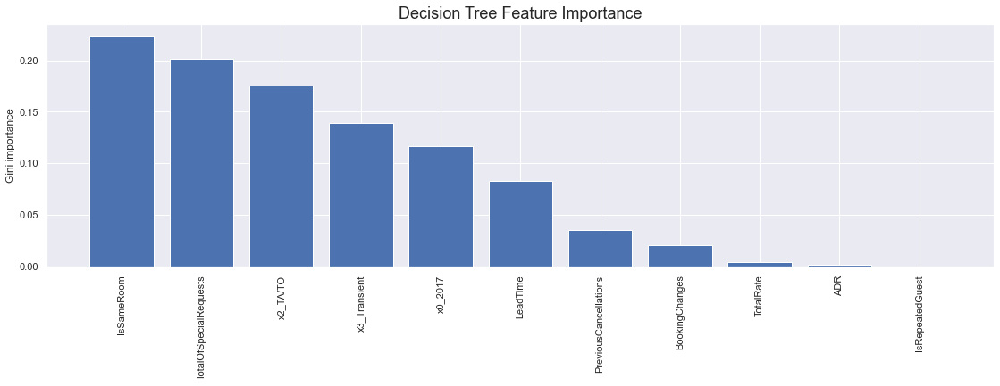

In [135]:
# Decision Tree Feature Importance plot
sns.set()

# data
feature_names = hotel.columns
feature_importances = pd.Series(best_dt.feature_importances_, index=feature_names).\
    sort_values(ascending=False)

# figure
fig = plt.figure(figsize=(19,5))

# axis
plt.bar(x=feature_importances.index, height=feature_importances.values)

# properties
plt.ylabel("Gini importance")  # The importance of a feature is computed as the (normalized) total reduction of the 
                               # criterion brought by that feature. It is also known as the Gini importance.
plt.xticks(rotation=90)
plt.title("Decision Tree Feature Importance", fontsize=18)

plt.show()

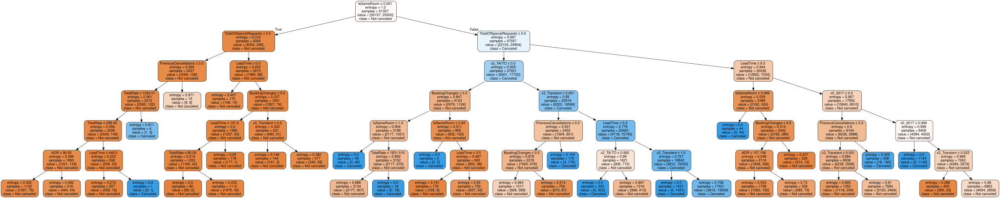

In [136]:
# Visualize decision tree
dot_data = export_graphviz(best_dt, out_file=None, 
                           feature_names=feature_names,  
                           class_names=['Not canceled', 'Canceled'],  
                           filled=True, rounded=True,  
                           special_characters=True)  
graphviz.Source(dot_data)

-------------------------------------------------------------------------------------------------------------------

In [137]:
def metrics(y_train, pred_train , y_val, pred_val):
    print('___________________________________________________________________________________________________________')
    print(' TRAIN ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_train, pred_train))
    print(confusion_matrix(y_train, pred_train))




    print('___________________________________________________________________________________________________________')
    print(' VALIDATION ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_val, pred_val))
    print(confusion_matrix(y_val, pred_val))

In [138]:
dt_gini_1 = DecisionTreeClassifier(splitter='best',criterion = 'entropy',random_state=42,max_features= None, max_depth=6, min_samples_split=0.001)

In [139]:
dt_gini=dt_gini_1.fit(X_train, y_train)

In [140]:
y_pred_train=dt_gini.predict(X_train)
y_pred = dt_gini.predict(X_val)
y_pred

array([1, 1, 0, ..., 0, 0, 1], dtype=int64)

In [141]:
y_pred_prob = dt_gini.predict_proba(X_val)
y_pred_prob

array([[0.21881637, 0.78118363],
       [0.        , 1.        ],
       [0.58341833, 0.41658167],
       ...,
       [0.67510549, 0.32489451],
       [0.93181818, 0.06818182],
       [0.21881637, 0.78118363]])

In [142]:
print('The defined tree has a depth of ' + str(dt_gini.get_depth()) + ', ' + str(dt_gini.tree_.node_count) +
' nodes and a total of ' + str(dt_gini.get_n_leaves()) + ' leaves.')

The defined tree has a depth of 6, 87 nodes and a total of 44 leaves.


In [143]:
# Metrics using the default threshold = 0.50
metrics(y_train, y_pred_train, y_val, y_pred)

___________________________________________________________________________________________________________
 TRAIN 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.73      0.85      0.79     26157
           1       0.82      0.67      0.74     25200

    accuracy                           0.77     51357
   macro avg       0.77      0.76      0.76     51357
weighted avg       0.77      0.77      0.76     51357

[[22344  3813]
 [ 8249 16951]]
___________________________________________________________________________________________________________
 VALIDATION 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.73      0.85      0.79     11211
           1       0.82      0.68      0.74     10800

    accuracy             

In [144]:
print('Train accuracy:',dt_gini_1.score(X_train, y_train))
print('Validation accuracy:',dt_gini_1.score(X_val, y_val))

Train accuracy: 0.7651342562844403
Validation accuracy: 0.7679342147108265


In [145]:
# Test set confusion matrix
pd.DataFrame(data=confusion_matrix(y_val, y_pred),
index=pd.Index(y_train.unique(), name="True"),
columns=pd.Index(y_train.unique(), name="Pred"))

Pred,1,0
True,,
1,9564,1647
0,3461,7339


In [146]:
# Check change in accurancy due to threshold = 0.40
threshold=0.4
predict_proba=dt_gini_1.predict_proba(X_val)
pred=(predict_proba[:,1]>=threshold).astype("int")

accuracy=accuracy_score(y_val,pred)
print(accuracy)
precision=precision_score(y_val,pred)
print(precision)

0.7417654808959157
0.7143814951391216


In [147]:
metrics(y_train, y_pred_train, y_val, pred)

___________________________________________________________________________________________________________
 TRAIN 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.73      0.85      0.79     26157
           1       0.82      0.67      0.74     25200

    accuracy                           0.77     51357
   macro avg       0.77      0.76      0.76     51357
weighted avg       0.77      0.77      0.76     51357

[[22344  3813]
 [ 8249 16951]]
___________________________________________________________________________________________________________
 VALIDATION 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.77      0.70      0.73     11211
           1       0.71      0.79      0.75     10800

    accuracy             

In [148]:
error_rate=(2276+3408)/(7803+ 3408+2276+ 8524)
error_rate

0.25823451910408435

In [149]:
predict_proba

array([[0.21881637, 0.78118363],
       [0.        , 1.        ],
       [0.58341833, 0.41658167],
       ...,
       [0.67510549, 0.32489451],
       [0.93181818, 0.06818182],
       [0.21881637, 0.78118363]])

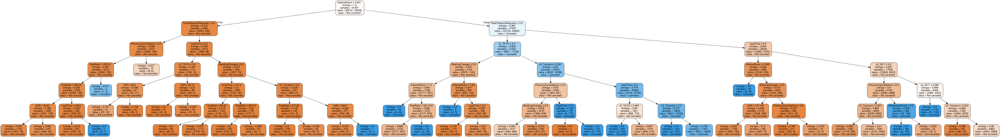

In [150]:
# Visualize decision tree
dot_data = export_graphviz(dt_gini_1, out_file=None, 
                           feature_names=feature_names,  
                           class_names=['Not canceled', 'Canceled'],  
                           filled=True, rounded=True,  
                           special_characters=True)  
graphviz.Source(dot_data)

In [152]:
from sklearn import metrics

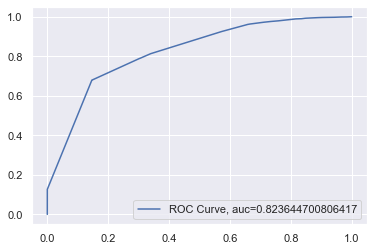

In [153]:
# ROC Curve with the default threshold = 0.50
y_pred_proba = dt_gini_1.predict_proba(X_val)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_val,  y_pred_proba)
auc = metrics.roc_auc_score(y_val, y_pred_proba)
plt.plot(fpr,tpr,label="ROC Curve, auc="+str(auc))
plt.legend(loc=4)
plt.show()

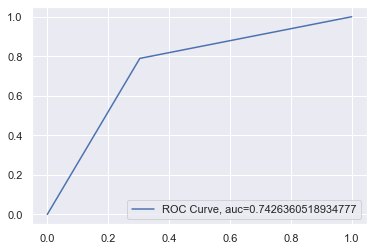

In [154]:
# ROC Curve with the defined threshold = 0.40
y_pred_proba = dt_gini_1.predict_proba(X_val)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_val,  pred)
auc = metrics.roc_auc_score(y_val, pred)
plt.plot(fpr,tpr,label="ROC Curve, auc="+str(auc))
plt.legend(loc=4)
plt.show()

In [155]:
# One example of a predicted record by giving certain values to the input variables
dt_gini_1.predict([[50,1,30,10,50,2,1,1,0,0,0]])

array([1], dtype=int64)